In [1]:
# Retina mode
%config InlineBackend.figure_format = 'retina'
%matplotlib inline

In [2]:
import os
import subprocess

import pandas as pd
import torch
import torchvision
import torch.nn as nn
import torch.optim as optim
from torchvision.models import resnet18
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
import torch.nn.functional as F
import time
import numpy as np
import tarfile

from torchvision.datasets.utils import download_url
from torchvision.datasets import ImageFolder
import torchvision.transforms as tt

torch.manual_seed(100)

In [3]:
def load_example(df_row):
    image = torchvision.io.read_image(df_row['image_path'])

    result = {
        'image': image,
        'class': df_row['Class']
    }
    return result

In [ ]:
class HiddenDataset(Dataset):
    def __init__(self, split='train'):
        super().__init__()
        self.examples = []
        if split == 'val':
            df = pd.read_csv(f'FashionMNIST/{split}_mini.csv')
        else:
            df = pd.read_csv(f'FashionMNIST/{split}_mini.csv')
        df['image_path'] = df['Image_File'].apply(
            lambda x: os.path.join('FashionMNIST/train/', x))
        df = df.sort_values(by='image_path')
        df.apply(lambda row: self.examples.append(load_example(row)), axis=1)
        if len(self.examples) == 0:
            raise ValueError('No examples.')

    def __len__(self):
        return len(self.examples)

    def __getitem__(self, idx):
        example = self.examples[idx]
        image = example['image']
        image = image.to(torch.float32)
        example['image'] = image
        return example

In [ ]:
def get_dataset(batch_size):
    train_ds = HiddenDataset(split='train')
    retain_ds = HiddenDataset(split='retain')
    forget_ds = HiddenDataset(split='forget')
    val_ds = HiddenDataset(split='val')

    retain_loader = DataLoader(retain_ds, batch_size=batch_size, shuffle=True)
    forget_loader = DataLoader(forget_ds, batch_size=batch_size, shuffle=True)
    train_loader = DataLoader(train_ds, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_ds, batch_size=batch_size, shuffle=True)

    return retain_loader, forget_loader, train_loader, val_loader

In [ ]:
retain_loader, forget_loader, train_loader, val_loader = get_dataset(64)

In [ ]:
# model = resnet18(pretrained=False, num_classes=10)

# criterion = nn.CrossEntropyLoss()
# optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)

# num_epochs = 10

# for epoch in range(num_epochs):
#     model.train()
#     for i , sample in enumerate(train_loader):

#         inputs = sample["image"]
#         labels = sample["class"]
#         optimizer.zero_grad()

#         # Make 3 channels for RGB
#         inputs = torch.cat((inputs, inputs, inputs), 1)

#         outputs = model(inputs)
#         loss = criterion(outputs, labels)
#         loss.backward()
#         optimizer.step()

#     print(f'Epoch {epoch+1}/{num_epochs}, Loss: {loss.item()}')

# checkpoint_path = 'learned_resnet.pth'
# torch.save(model.state_dict(), checkpoint_path)

## Load Dataset and Create Dataloaders

In [3]:
# Dowload the dataset
dataset_url = "https://s3.amazonaws.com/fast-ai-imageclas/cifar10.tgz"
download_url(dataset_url, '.')

# Extract from archive
with tarfile.open('./cifar10.tgz', 'r:gz') as tar:
    tar.extractall(path='./data')

# Look into the data directory
data_dir = './data/cifar10'
print(os.listdir(data_dir))
classes = os.listdir(data_dir + "/train")
print(classes)

100%|██████████| 135107811/135107811 [00:02<00:00, 57186605.42it/s]


['test', 'train']
['deer', 'bird', 'cat', 'dog', 'airplane', 'ship', 'frog', 'horse', 'truck', 'automobile']


In [4]:
# Look into the data directory
data_dir = '/content/data/cifar10'
print(os.listdir(data_dir))
classes = os.listdir(data_dir + "/train")
print(classes)

['test', 'train']
['deer', 'bird', 'cat', 'dog', 'airplane', 'ship', 'frog', 'horse', 'truck', 'automobile']


In [5]:
transform_train = tt.Compose([
    tt.ToTensor(),
    tt.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

transform_test = tt.Compose([
    tt.ToTensor(),
    tt.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

In [17]:
train_ds = ImageFolder(data_dir+'/train', transform_train)
valid_ds = ImageFolder(data_dir+'/test', transform_test)

batch_size = 256
train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=3, pin_memory=True)
valid_dl = DataLoader(valid_ds, batch_size*2, num_workers=3, pin_memory=True)

device = device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
num_classes = 10
model = resnet18(num_classes = 10).to(device = device)
# model.fc = nn.Linear(model.fc.in_features, num_classes)

## Create Retain and Forget Dataset

In [18]:
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader, Subset

# Function to split dataset into retain and forget sets based on specified class
def split_dataset_by_class(dataset, class_to_forget):
    retain_indices = []
    forget_indices = []
    for idx, (image, label) in enumerate(dataset):
        if label == class_to_forget:
            forget_indices.append(idx)
        else:
            retain_indices.append(idx)
    return retain_indices, forget_indices


# Specify the class you want to forget
class_to_forget = 5  # Change this to the class you want to forget

# Split dataset into retain and forget sets
retain_indices, forget_indices = split_dataset_by_class(train_ds, class_to_forget)

# Create retain and forget datasets
retain_dataset = Subset(train_ds, retain_indices)
forget_dataset = Subset(train_ds, forget_indices)

# Create data loaders
batch_size = 256
retain_loader = DataLoader(retain_dataset, batch_size=batch_size, shuffle=True, num_workers=3, pin_memory=True)
forget_loader = DataLoader(forget_dataset, batch_size=batch_size, shuffle=True, num_workers=3, pin_memory=True)


In [19]:
def accuracy(net, dataloader):
    correct = 0
    total = 0
    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloader):

            images = inputs.to(device)
            labels = labels.to(device)
            # images = data['image']
            # images = torch.cat((images, images, images), dim=1)
            # labels = data['class']
            outputs = net(images)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    acc = 100 * correct / total
    return acc

In [9]:
# accuracy(model, train_loader)

In [10]:
def kl_loss(model_logits, teacher_logits, temperature=1.):
    teacher_output_softmax = F.softmax(teacher_logits / temperature, dim=1)
    output_log_softmax = F.log_softmax(model_logits / temperature, dim=1)

    kl_div = F.kl_div(output_log_softmax, teacher_output_softmax, reduction='batchmean')
    return kl_div

In [11]:
def soft_cross_entropy(preds, soft_targets):
    loss = torch.sum(-soft_targets * torch.log_softmax(preds, dim=1), dim=1)
    return torch.mean(loss)

In [13]:
acc_retain_unlearned = []
acc_forget_unlearned = []

In [14]:
def unlearning(model, teacher_model, retain_loader, forget_loader, val_loader, temperature=1.,
               weight=None):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    model.to(device)
    teacher_model.to(device)

    model.conv1.reset_parameters()
    model.fc.reset_parameters()

    teacher_model.eval()

    retain_epochs = 6
    warmup_epochs = 2

    acc_retain_unlearned.append(accuracy(model, retain_loader))
    acc_forget_unlearned.append(accuracy(model, forget_loader))

    criterion = nn.CrossEntropyLoss(weight=weight)

    optimizer = torch.optim.SGD(model.parameters(), lr=9e-4, weight_decay=5e-4, momentum=0.9)
    for epoch in range(warmup_epochs):
        print(f'Warmup epoch {epoch+1}/{warmup_epochs}')
        model.train()
        for i, (inputs, labels) in enumerate(val_loader):
            inputs = inputs.to(device)
            labels = labels.to(device)

            # forward inputs and get output
            optimizer.zero_grad()
            student_out = model(inputs)
            with torch.no_grad():
                teacher_out = teacher_model(inputs)

            loss = kl_loss(model_logits=student_out,
                           teacher_logits=teacher_out,
                           temperature=temperature)
            loss.backward()
            optimizer.step()

        acc_retain_unlearned.append(accuracy(model, retain_loader))
        acc_forget_unlearned.append(accuracy(model, forget_loader))

    optimizer = torch.optim.SGD(model.parameters(),
                                lr=1e-3, weight_decay=5e-4, momentum=0.9)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
        optimizer, T_max=retain_epochs
    )

    for epoch in range(retain_epochs):
        print(f'Retain epoch {epoch+1}/{retain_epochs}')
        model.train()
        for i, (inputs, labels) in enumerate(retain_loader):
            inputs = inputs.to(device)
            labels = labels.to(device)
            optimizer.zero_grad()
            out = model(inputs)
            with torch.no_grad():
                teacher_out = teacher_model(inputs)
            soft_labels = torch.softmax(teacher_out / temperature, dim=1)
            soft_predictions = torch.log_softmax(out / temperature, dim=1)
            loss = soft_cross_entropy(soft_predictions, soft_labels)
            loss += criterion(out, labels)
            loss += kl_loss(model_logits=out,
                           teacher_logits=teacher_out,
                           temperature=temperature)
            loss.backward()
            optimizer.step()
        scheduler.step()

        acc_retain_unlearned.append(accuracy(model, retain_loader))
        acc_forget_unlearned.append(accuracy(model, forget_loader))

    model.eval()


In [27]:
def unlearning(model, teacher_model, retain_loader, forget_loader, val_loader, temperature=1.,
               weight=None):

    model.conv1.reset_parameters()
    model.fc.reset_parameters()

    teacher_model.eval()

    retain_epochs = 6
    warmup_epochs = 2

    acc_retain_unlearned.append(accuracy(model, retain_loader))
    acc_forget_unlearned.append(accuracy(model, forget_loader))

    criterion = nn.CrossEntropyLoss(weight=weight)

    optimizer = torch.optim.SGD(model.parameters(), lr=9e-4, weight_decay=5e-4, momentum=0.9)
    for epoch in range(warmup_epochs):
        print(f'Warmup epoch {epoch+1}/{warmup_epochs}')
        model.train()
        for i, (inputs, labels) in enumerate(val_loader):
            x = inputs
            y = labels

            # forward inputs and get output
            optimizer.zero_grad()
            student_out = model(x)
            with torch.no_grad():
                teacher_out = teacher_model(x)

            loss = kl_loss(model_logits=student_out,
                           teacher_logits=teacher_out,
                           temperature=temperature)
            loss.backward()
            optimizer.step()

        # for sample in val_loader:
        #     x = sample["image"]
        #     x = torch.cat((x, x, x), dim=1)
        #     y = sample["class"]
        #     optimizer.zero_grad()
        #     student_out = model(x)

        #     with torch.no_grad():
        #         teacher_out = teacher_model(x)

        #     loss = kl_loss(model_logits=student_out,
        #                    teacher_logits=teacher_out,
        #                    temperature=temperature)
        #     loss.backward()
        #     optimizer.step()

        acc_retain_unlearned.append(accuracy(model, retain_loader))
        acc_forget_unlearned.append(accuracy(model, forget_loader))

    optimizer = torch.optim.SGD(model.parameters(),
                                lr=1e-3, weight_decay=5e-4, momentum=0.9)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
        optimizer, T_max=retain_epochs
    )

    # for i, (inputs, labels) in enumerate(train_dl):
    #         x = inputs.to(device)
    #         y = labels.to(device)

    #         # forward inputs and get output
    #         optimizer.zero_grad()
    #         student_out = model()
    #         with torch.no_grad():
    #             teacher_out = teacher_model(x)

    #         loss = kl_loss(model_logits=student_out,
    #                        teacher_logits=teacher_out,
    #                        temperature=temperature)
    #         loss.backward()
    #         optimizer.step()
    for epoch in range(retain_epochs):
        print(f'Retain epoch {epoch+1}/{retain_epochs}')
        model.train()
        for i, (inputs, labels) in enumerate(retain_loader):
            x = inputs
            y = labels
            optimizer.zero_grad()
            out = model(x)
            with torch.no_grad():
                teacher_out = teacher_model(x)
            soft_labels = torch.softmax(teacher_out / temperature, dim=1)
            soft_predictions = torch.log_softmax(out / temperature, dim=1)
            loss = soft_cross_entropy(soft_predictions, soft_labels)
            loss += criterion(out, y)
            loss += kl_loss(model_logits=out,
                           teacher_logits=teacher_out,
                           temperature=temperature)
            loss.backward()
            optimizer.step()
        scheduler.step()

        acc_retain_unlearned.append(accuracy(model, retain_loader))
        acc_forget_unlearned.append(accuracy(model, forget_loader))

    model.eval()

In [15]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [16]:
trained_model_path = '/content/drive/MyDrive/ResNET18_CIFAR10_15_epochs.pt'

In [38]:
original_net = resnet18(weights=None, num_classes=10)
original_net.load_state_dict(torch.load(trained_model_path))

unleaned_net = resnet18(weights=None, num_classes=10)
unleaned_net.load_state_dict(torch.load(trained_model_path))

start = time.process_time()
unlearning(unleaned_net , original_net , retain_loader , forget_loader , valid_dl , 5 , None)
time_unlearned = time.process_time() - start

state = unleaned_net.state_dict()
torch.save(state, '/content/checkpoints/unlearned_resnet_resetting_layer.pt')

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Warmup epoch 1/2
Warmup epoch 2/2
Retain epoch 1/6
Retain epoch 2/6
Retain epoch 3/6
Retain epoch 4/6
Retain epoch 5/6
Retain epoch 6/6


In [12]:
acc_forget_retain = []
acc_retain_retain = []

In [ ]:
# retain_loader, forget_loader, train_loader , val_loader= get_dataset(64)

retained_net = resnet18(pretrained=True)
num_features = retained_net.fc.in_features
retained_net.fc = nn.Linear(num_features, 10)

criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(retained_net.parameters(), lr=0.001, momentum=0.9)

num_epochs = 10

acc_forget_retain.append(accuracy(retained_net, forget_loader))
acc_retain_retain.append(accuracy(retained_net, retain_loader))

start = time.process_time()
for epoch in range(num_epochs):
    retained_net.train()
    for i, (inputs, labels) in enumerate(retain_loader):
        inputs = inputs
        labels = labels
        optimizer.zero_grad()

        # Make 3 channels for RGB
        # inputs = torch.cat((inputs, inputs, inputs), 1)

        outputs = retained_net(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

    acc_forget_retain.append(accuracy(retained_net, forget_loader))
    acc_retain_retain.append(accuracy(retained_net, retain_loader))

    print(f"Epoch {epoch+1}/{num_epochs}, Loss: {loss.item()}")

time_retained = (time.process_time() - start)

checkpoint_path = "retained_resnet.pt"
torch.save(retained_net.state_dict(), checkpoint_path)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 125MB/s]
/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current 

Epoch 1/10, Loss: 0.7628430128097534
Epoch 2/10, Loss: 0.7396771311759949


In [19]:
original_net = resnet18(weights=None, num_classes=10)
original_net.load_state_dict(torch.load(trained_model_path, map_location=torch.device('cpu')))

unleaned_net = resnet18(weights=None, num_classes=10)
unleaned_net.load_state_dict(torch.load('/content/drive/MyDrive/unlearned_resnet_resetting_layer.pt', map_location=torch.device('cpu')))



<All keys matched successfully>

In [20]:
print("Original Model Accuracy on Retained Set:" , accuracy(original_net, retain_loader))
print("Original Model Accuracy on Forget Set:" , accuracy(original_net, forget_loader))

print("Unlearned Model Accuracy on Retained Set:" , accuracy(unleaned_net, retain_loader))
print("Unlearned Model Accuracy on Forget Set:" , accuracy(unleaned_net, forget_loader))

print("Untrained Model Accuracy on Retained Set:" , accuracy(untrained_net, retain_loader))
print("Untrained Model Accuracy on Forget Set:" , accuracy(untrained_net, forget_loader))

# print("Retained Model Accuracy on Retained Set:" , accuracy(retained_net, retain_loader))
# print("Retained Model Accuracy on Forget Set:" , accuracy(retained_net, forget_loader))

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Original Model Accuracy on Retained Set: 85.52444444444444
Original Model Accuracy on Forget Set: 8.68
Unlearned Model Accuracy on Retained Set: 80.46666666666667
Unlearned Model Accuracy on Forget Set: 0.0
Untrained Model Accuracy on Retained Set: 11.98
Untrained Model Accuracy on Forget Set: 1.26


In [ ]:
# Print the time taken for unlearning and retaining
print(f"Time taken for unlearning: {time_unlearned}")
print(f"Time taken for retaining: {time_retained}")

Time taken for unlearning: 171.953125
Time taken for retaining: 210.890625


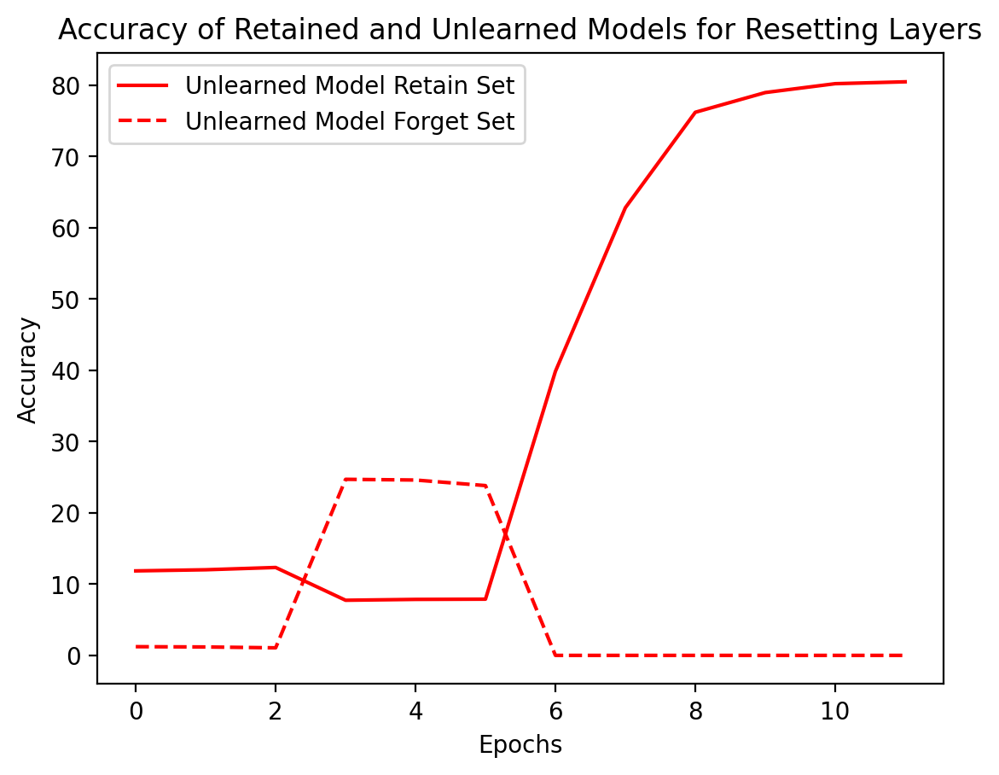

In [41]:
# Plot the accuracy of the models
import matplotlib.pyplot as plt

plt.plot(acc_retain_unlearned, label="Unlearned Model Retain Set" , color = 'red')
plt.plot(acc_forget_unlearned, label="Unlearned Model Forget Set" , color = 'red' , linestyle = 'dashed')
# plt.plot(acc_retain_retain, label="Retained Model Retain Set" , color = 'green')
# plt.plot(acc_forget_retain, label="Retained Model Forget Set" , color = 'green' , linestyle = 'dashed')
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()
plt.title("Accuracy of Retained and Unlearned Models for Resetting Layers")
# plt.savefig("posterimgs/acc_rl.png")
plt.show()

In [42]:
# Plot a histogram of logits for the retained set of the original model and the unlearned model
import matplotlib.pyplot as plt
import numpy as np

def plot_logits(net, dataloader , title , name):
    logits = []
    with torch.no_grad():
        for data in dataloader:
            images = data['image']
            images = torch.cat((images, images, images), dim=1)
            labels = data['class']
            outputs = net(images)
            logits.extend(outputs.numpy())
    logits = np.array(logits)
    plt.hist(logits, bins=100)
    plt.xlim(-10, 10)
    plt.title(title)
    path = f"posterimgs/{name}.png"
    plt.savefig(path)
    plt.show()

plot_logits(original_net, retain_loader , "Original Model Retain Set Logits for RL" , "original_retain_logits_rl")
plot_logits(unleaned_net, retain_loader , "Unlearned Model Retain Set Logits for RL" , "unlearned_retain_logits_rl")

# Plot a histogram of logits for the forget set of the original model and the unlearned model
plot_logits(original_net, forget_loader , "Original Model Forget Set Logits for RL" , "original_forget_logits_rl")
plot_logits(unleaned_net, forget_loader , "Unlearned Model Forget Set Logits for RL" , "unlearned_forget_logits_rl")

TypeError: list indices must be integers or slices, not str

## Grad CAM output for untrained model

In [43]:
! pip install grad-cam

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 24.3 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  U

In [17]:
from torchvision import datasets, models, transforms
# initialize a fresh resnet model
untrained_net = models.resnet18(pretrained=True)
num_features = untrained_net.fc.in_features
untrained_net.fc = nn.Linear(num_features, 10) # multi-class classification (num_of_class == 307)
untrained_net = untrained_net.to(device)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 95.3MB/s]


In [124]:

def grad_cam_output(img_path) :
    img_name = img_path.split('/')[-1]
    test_img = torchvision.io.read_image(img_path)
    test_img = torchvision.transforms.functional.resize(test_img, (224, 224))
    target_layers_trained = [original_net.layer4[-1]]
    target_layers_untrained = [untrained_net.layer4[-1]]
    target_layers_unlearned = [unleaned_net.layer4[-1]]

    from pytorch_grad_cam import GradCAM, HiResCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM, FullGrad
    from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
    from pytorch_grad_cam.utils.image import show_cam_on_image

    cam_trained = GradCAM(model=original_net, target_layers=target_layers_trained)
    cam_untrained = GradCAM(model=untrained_net, target_layers=target_layers_untrained)
    cam_unlearned = GradCAM(model=unleaned_net, target_layers=target_layers_unlearned)


    grayscale_cam_trained = cam_trained(input_tensor=test_img.unsqueeze(0).float(), targets=None)
    grayscale_cam_trained = grayscale_cam_trained[0, :]
    rgb_img = test_img.permute(1, 2, 0).numpy()
    rgb_img = rgb_img / 255
    visualization_trained = show_cam_on_image(rgb_img, grayscale_cam_trained, use_rgb=True)

    grayscale_cam_untrained = cam_untrained(input_tensor=test_img.unsqueeze(0).float(), targets=None)
    grayscale_cam_untrained = grayscale_cam_untrained[0, :]
    visualization_untrained = show_cam_on_image(rgb_img, grayscale_cam_untrained, use_rgb=True)

    grayscale_cam_unlearned = cam_unlearned(input_tensor=test_img.unsqueeze(0).float(), targets=None)
    grayscale_cam_unlearned = grayscale_cam_unlearned[0, :]
    visualization_unlearned = show_cam_on_image(rgb_img, grayscale_cam_unlearned, use_rgb=True)

    # Display visualization with matplotlib
    import matplotlib.pyplot as plt
    plt.figure(figsize=(15, 10))
    plt.subplot(1, 4, 1)
    plt.title(f'Original {img_name}')
    plt.imshow(rgb_img)
    plt.axis('off')
    plt.subplot(1, 4, 3)
    plt.title('Trained Model GradCAM')
    plt.imshow(visualization_trained)
    plt.axis('off')
    plt.subplot(1, 4, 2)
    plt.title('Untrained Model GradCAM')
    plt.imshow(visualization_untrained)
    plt.axis('off')
    plt.subplot(1, 4, 4)
    plt.title('Unlearned Model GradCAM')
    plt.imshow(visualization_unlearned)
    plt.axis('off')
    plt.show()


In [121]:
import os
import torchvision
from PIL import Image

def get_first_image_from_subfolders(main_folder):
    image_list = []
    # Iterate through each subfolder in the main folder
    for root, dirs, files in os.walk(main_folder):
        # Check if the folder contains any files
        if files:
            # Filter for image files (you can adjust this condition if needed)
            image_files = [f for f in files if f.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif'))]
            if image_files:
                # Grab the first image file
                first_image_path = os.path.join(root, image_files[0])
                image_list.append(first_image_path)
                # If you just want the path, you can append `first_image_path` instead of `image`
    return image_list

# Example usage:
main_folder = '/content/data/cifar10/test'
test_imgs = get_first_image_from_subfolders(main_folder)


In [86]:
train_ds.classes

['airplane',
 'automobile',
 'bird',
 'cat',
 'deer',
 'dog',
 'frog',
 'horse',
 'ship',
 'truck']

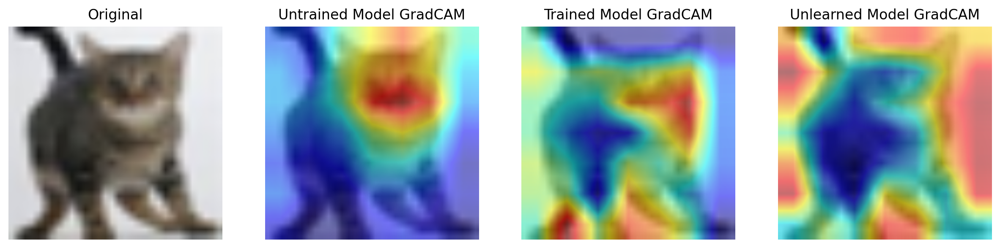

In [57]:
grad_cam_output(test_imgs[0])

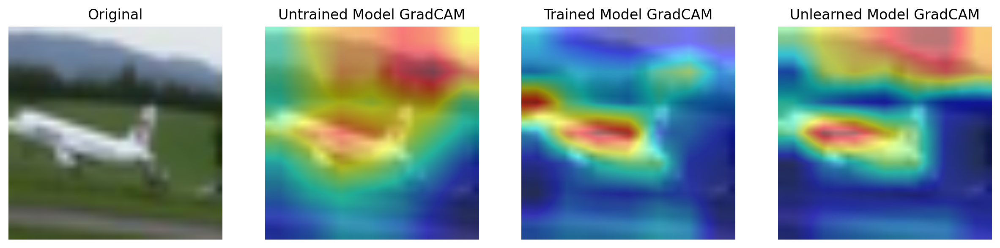

In [58]:
grad_cam_output(test_imgs[1])

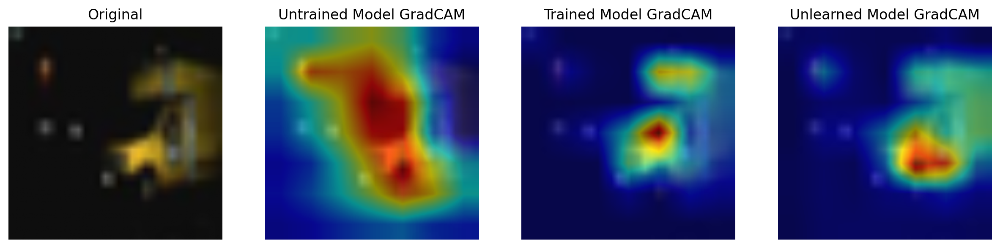

In [59]:
grad_cam_output(test_imgs[2])

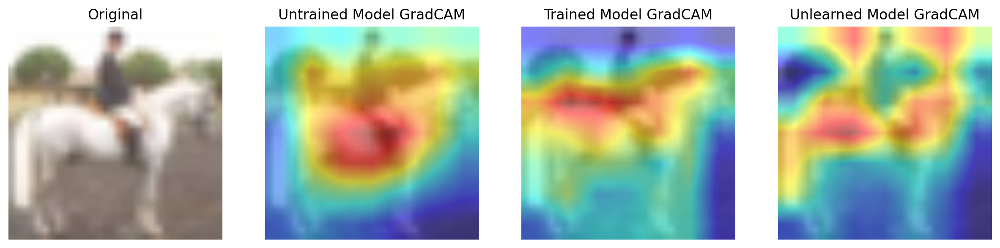

In [60]:
grad_cam_output(test_imgs[3])

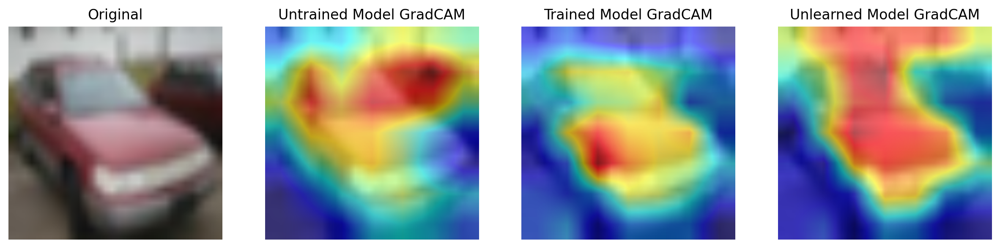

In [61]:
grad_cam_output(test_imgs[4])

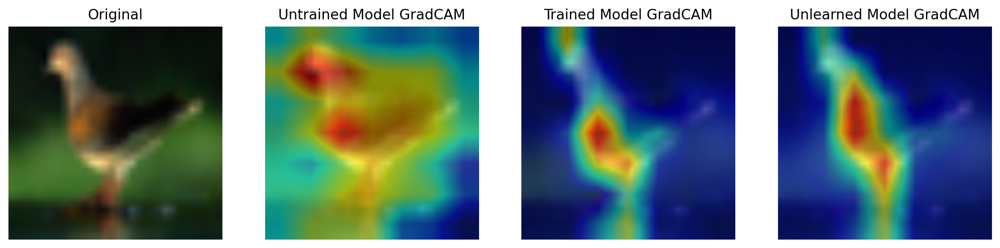

In [62]:
grad_cam_output(test_imgs[5])

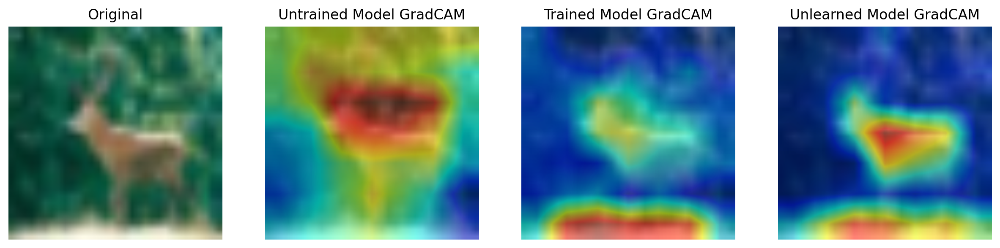

In [63]:
grad_cam_output(test_imgs[6])

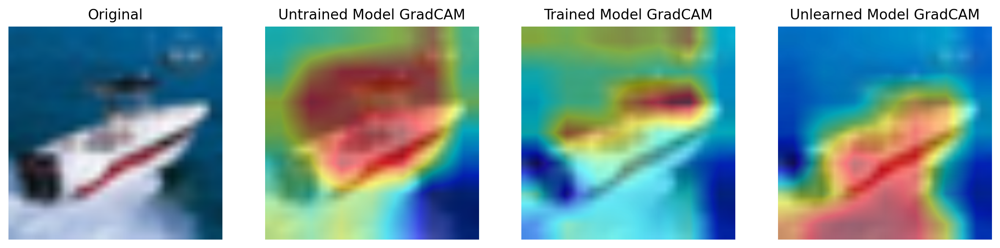

In [64]:
grad_cam_output(test_imgs[7])

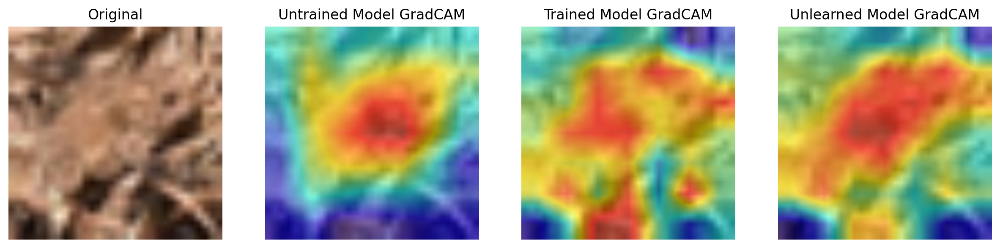

In [65]:
grad_cam_output(test_imgs[8])

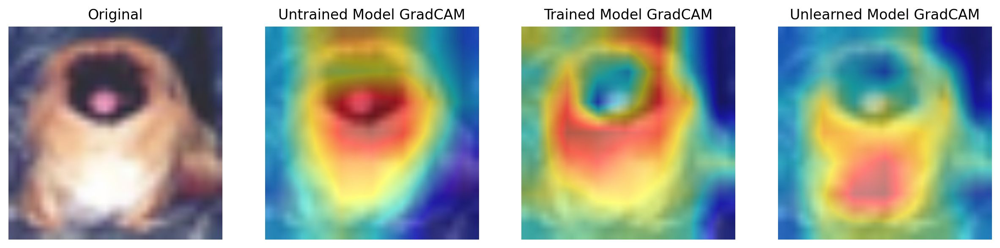

In [66]:
grad_cam_output(test_imgs[9])

In [67]:
import os
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

def plot_random_images(folder_path, num_images=5):
    # Get list of image files in the folder
    image_files = [f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f)) and f.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif'))]

    # Select num_images random images
    selected_images = random.sample(image_files, min(num_images, len(image_files)))

    # Plot the selected images
    num_rows = (num_images + 4) // 5  # Calculate number of rows for the grid
    fig, axes = plt.subplots(num_rows, 5, figsize=(15, 3*num_rows))

    for i, image_file in enumerate(selected_images):
        img = mpimg.imread(os.path.join(folder_path, image_file))
        if num_rows > 1:
            axes[i//5, i%5].imshow(img)
            axes[i//5, i%5].axis('off')
            axes[i//5, i%5].set_title(image_file)
        else:
            axes[i].imshow(img)
            axes[i].axis('off')
            axes[i].set_title(image_file)

    # Hide empty subplots
    for j in range(num_images, num_rows*5):
        if num_rows > 1:
            axes[j//5, j%5].axis('off')
        else:
            axes[j].axis('off')

    plt.tight_layout()
    plt.show()

# Example usage:



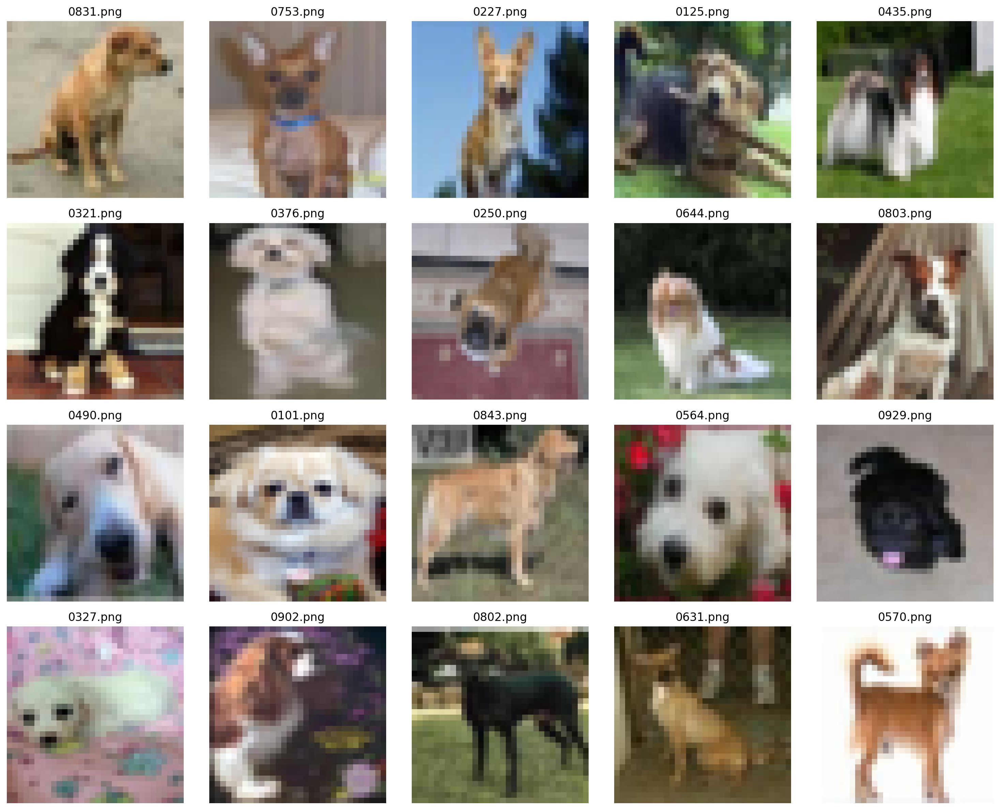

In [111]:
folder_path = '/content/data/cifar10/test/dog'
plot_random_images(folder_path, 20)

In [122]:
input_folder = '/content/data/cifar10/test/dog'
image_list = ['0753.png', '0590.png', '0227.png', '0803.png', '0570.png']  # List of image filenames
import torchvision
test_img = []

for i in range(len(image_list)):
  test_img.append(f'{input_folder}/{image_list[i]}')
  # test_img[i] = torchvision.transforms.functional.resize(test_img[i], (224, 224))

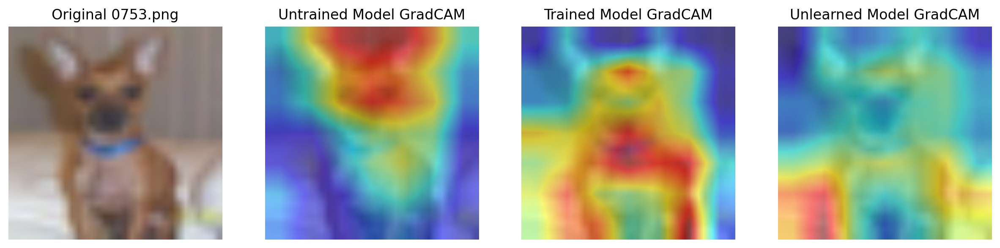

In [125]:
grad_cam_output(test_img[0])

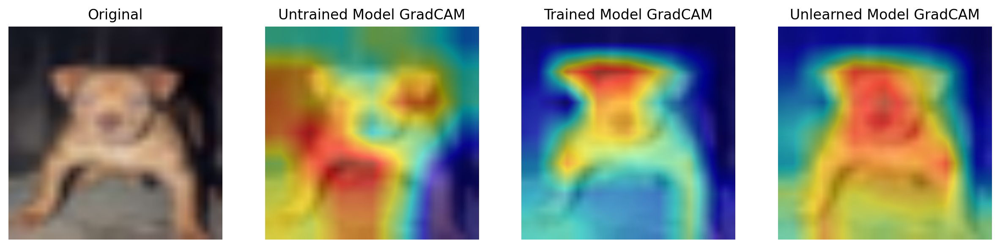

In [114]:
grad_cam_output(test_img[1])

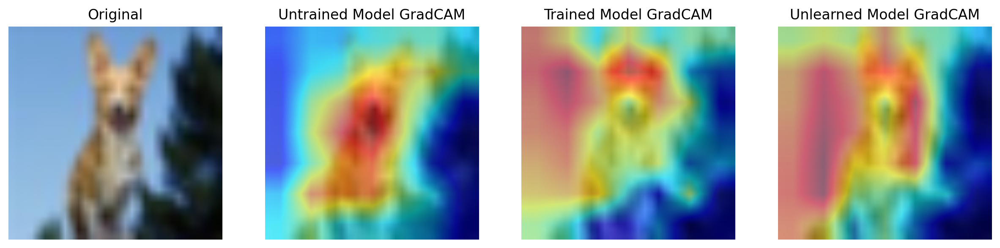

In [115]:
grad_cam_output(test_img[2])

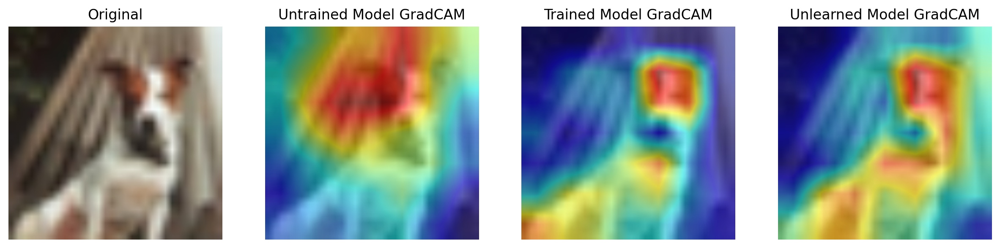

In [116]:
grad_cam_output(test_img[3])

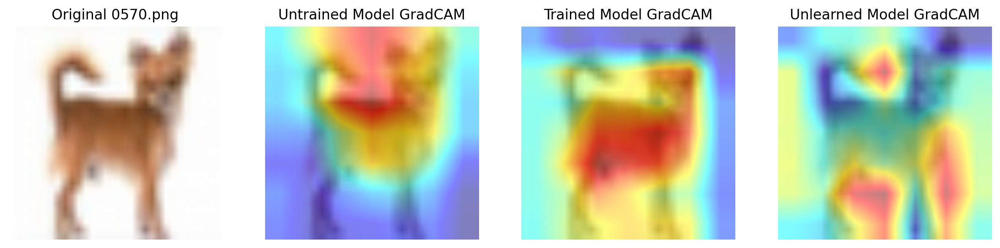

In [126]:
grad_cam_output(test_img[4])

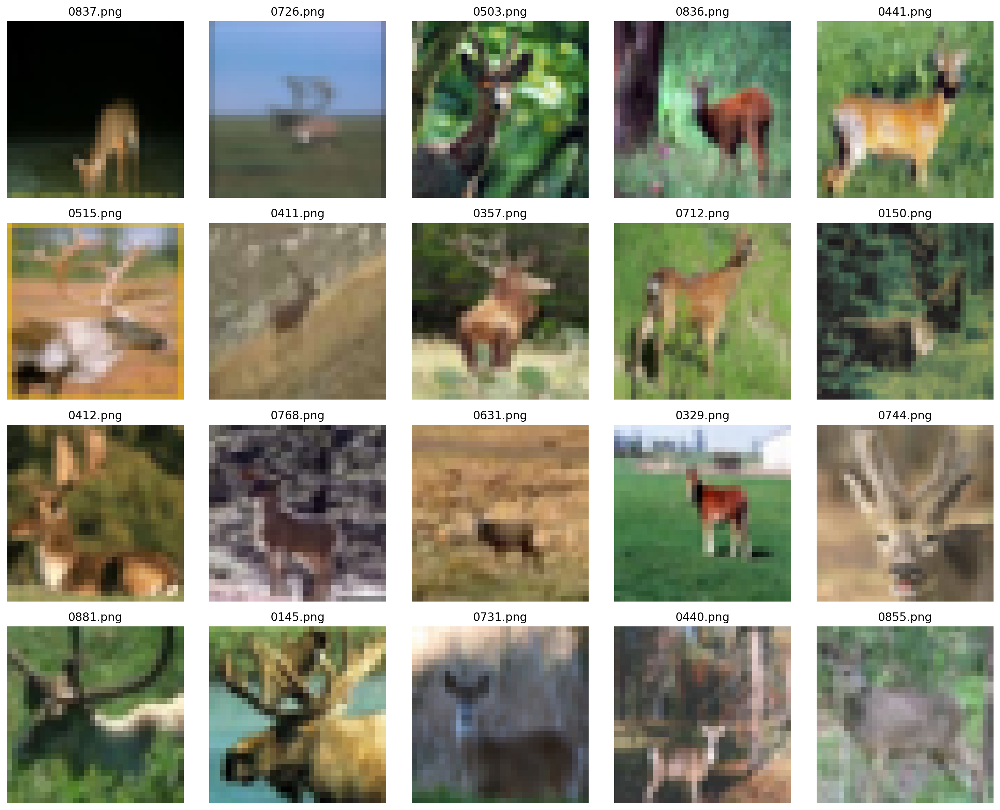

In [78]:
folder_path = '/content/data/cifar10/test/deer'
plot_random_images(folder_path, 20)

In [79]:
input_folder = '/content/data/cifar10/test/deer'
image_list = ['0232.png', '0219.png', '0084.png', '0503.png', '0515.png']  # List of image filenames
import torchvision
test_img = []

for i in range(len(image_list)):
  test_img.append(torchvision.io.read_image(f'{input_folder}/{image_list[i]}'))
  test_img[i] = torchvision.transforms.functional.resize(test_img[i], (224, 224))

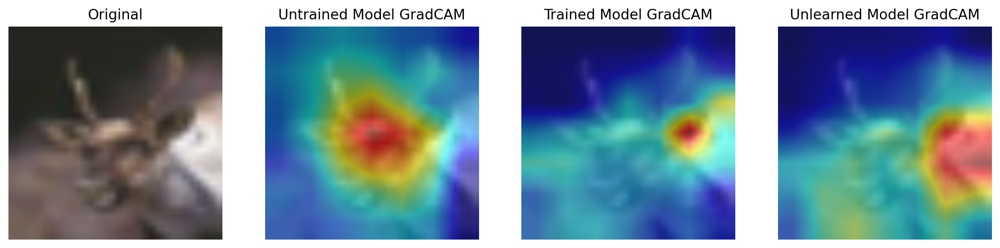

In [81]:
grad_cam_output(test_img[0])

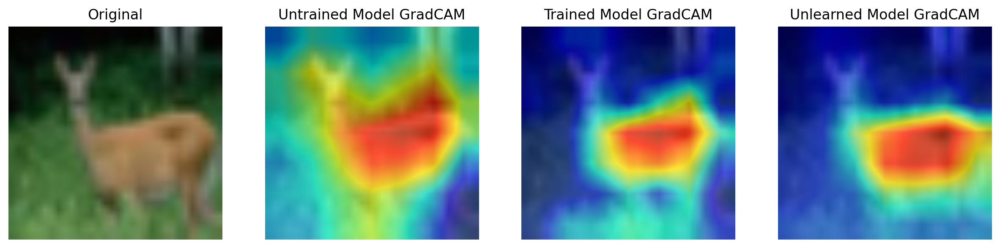

In [82]:
grad_cam_output(test_img[1])

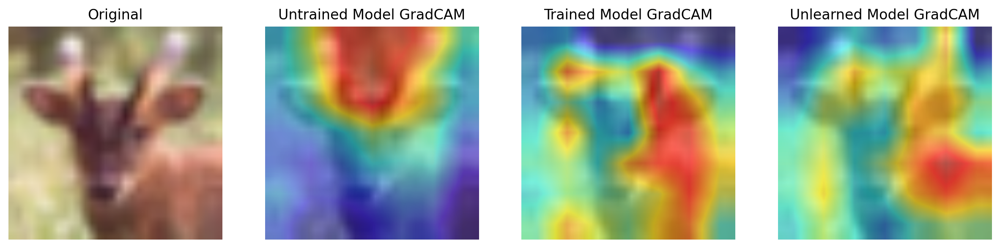

In [83]:
grad_cam_output(test_img[2])

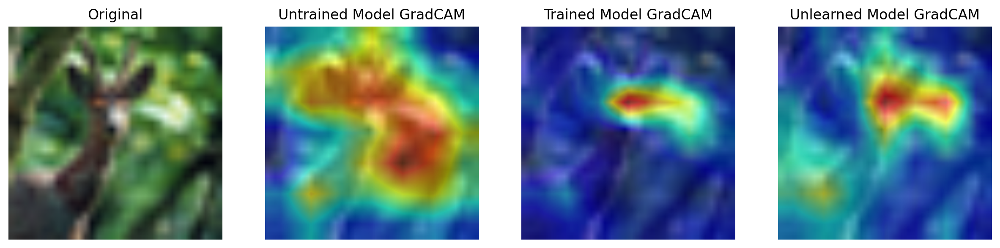

In [84]:
grad_cam_output(test_img[3])

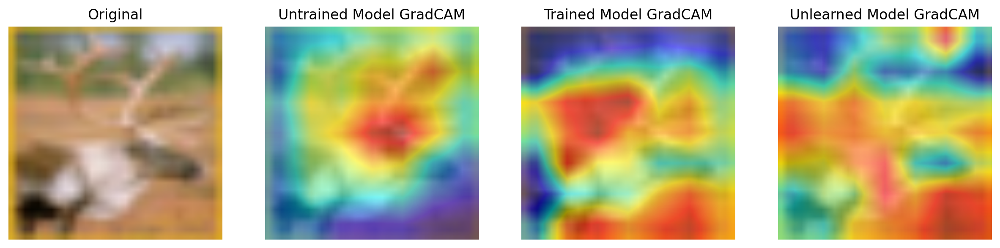

In [85]:
grad_cam_output(test_img[4])

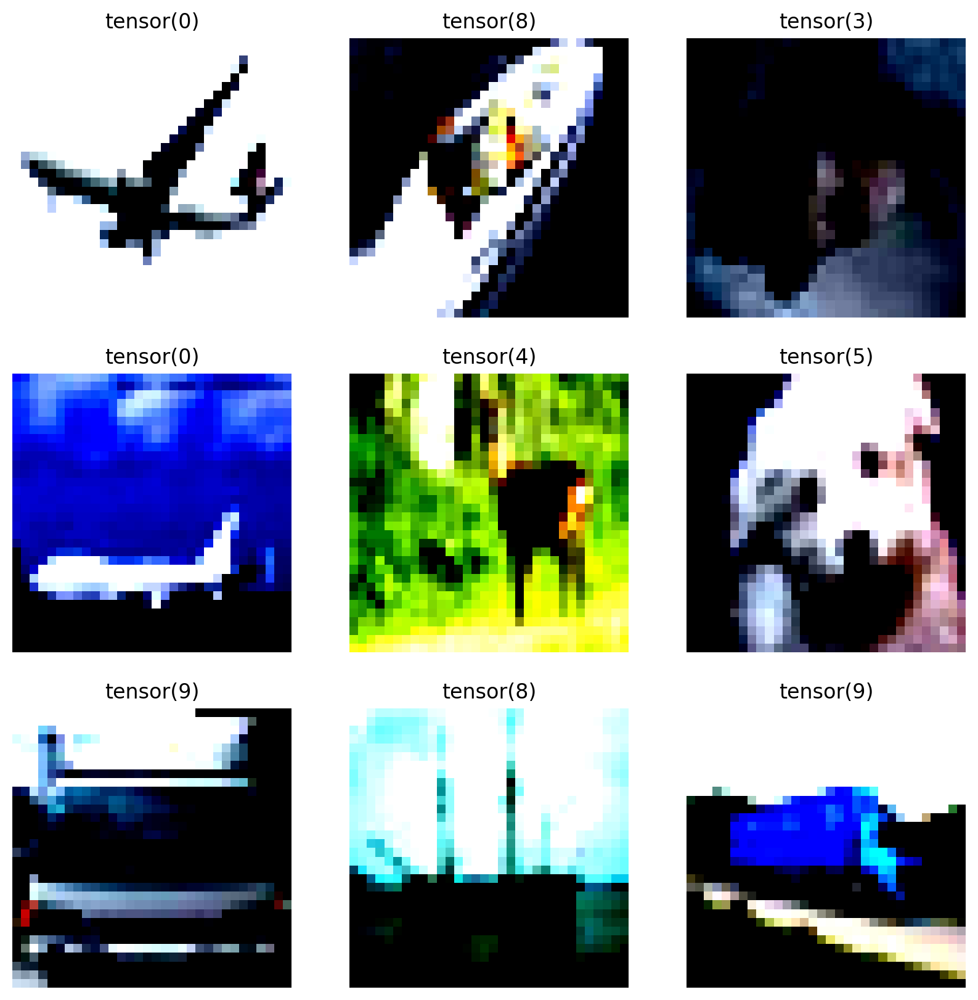

In [89]:
import matplotlib.pyplot as plt
import numpy as np

def show_images_grid(data_loader, num_images=9):
    # Get a batch of random images and labels from the data loader
    data_iter = iter(data_loader)
    images, labels = next(data_iter)

    # Generate random indices to select images
    indices = np.random.choice(len(images), num_images, replace=False)
    selected_images = images[indices]
    selected_labels = labels[indices]

    # Create a grid to display the images
    fig, axes = plt.subplots(3, 3, figsize=(10, 10))
    for i, ax in enumerate(axes.flat):
        # Display image
        ax.imshow(np.transpose(selected_images[i], (1, 2, 0)))
        ax.axis('off')
        # Display label
        ax.set_title(selected_labels[i])

    plt.show()

# Assuming you have a data loader `train_dl` and a list of classes `class_names`
show_images_grid(train_dl)
